Negative: 04:32
Positive: 04:31
Music: 00:49

In [20]:
import pandas as pd
import numpy as np
import os
import neurokit2 as nk
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

In [21]:
plt.rcParams['figure.figsize'] = [35, 5]  # Bigger images

In [22]:
Sample_rate = 200

In [23]:
ids_order = {'K4G7Y9O2.csv':'NP', 'M3A2H7Q4.csv':'PN', 'N7P5B8G0.csv':'PN', 'W1D9N0B8.csv':'NP', 'V9L0P2K7.csv':'PN', 'I8L4N6G7.csv': 'NA', 'J6W7Q4H5.csv': 'NA', 'L0S1Z2I3.csv': 'NA', 'R0V9G1L4.csv':'NA'}

In [24]:
Sample_rate = 200
id_partisipant = 'W1D9N0B8.csv'
order = ids_order[id_partisipant]

In [25]:
data = pd.read_csv(os.path.join('/Users/annapalatkina/Desktop/drive/driving_performance_project/data/',id_partisipant), comment='#')
data = data[['Row', 'Timestamp', 'Channel 9 (Raw)', 'Channel 13 (Raw)','MarkerName','MarkerType']]
data.head()

/var/folders/f1/w7d0x47j0qq9jn7k7vhjrkzh0000gn/T/ipykernel_39219/2028024485.py:1: DtypeWarning: Columns (3,4,6,15,16,17) have mixed types. Specify dtype option on import or set low_memory=False.
  data = pd.read_csv(os.path.join('/Users/annapalatkina/Desktop/drive/driving_performance_project/data/',id_partisipant), comment='#')


,Row,Timestamp,Channel 9 (Raw),Channel 13 (Raw),MarkerName,MarkerType
0,1,4.0017,NaN,NaN,NaN,NaN
1,2,4.0018,4.785461,0.247192,NaN,NaN
2,3,9.0018,4.786072,0.248108,NaN,NaN
3,4,9.0882,NaN,NaN,NaN,NaN
4,5,14.0018,4.786072,0.247803,NaN,NaN


In [26]:
data[data['MarkerName'].notna()].sort_values('Row')

,Row,Timestamp,Channel 9 (Raw),Channel 13 (Raw),MarkerName,MarkerType
37210,37211,90065.0297,NaN,NaN,Experiment,S
109554,109555,270251.2782,NaN,NaN,IntenseAudio,S
251056,251057,624539.5499,NaN,NaN,InterimAudio,S
251057,251058,624539.5499,NaN,NaN,IntenseAudio,E
270936,270937,674413.2895,NaN,NaN,CalmAudio,S
270937,270938,674413.2895,NaN,NaN,InterimAudio,E
386225,386226,973073.9851,NaN,NaN,CalmAudio,E
392512,392513,990035.7362,NaN,NaN,Experiment,E


In [27]:
len(data)

410524

In [28]:
#data['Channel 9 (Raw)'] = data['Channel 9 (Raw)'].where(data['Channel 9 (Raw)'] >= 0, np.nan)
#data['Channel 13 (Raw)'] = data['Channel 13 (Raw)'].where(data['Channel 13 (Raw)'] >= 0, np.nan)

## Negative values in ecg???

In [29]:
experiment_start = data[(data.MarkerName == "Experiment") & (data.MarkerType == "S")].Row.iloc[0]
experiment_end = data[(data.MarkerName == "Experiment") & (data.MarkerType == "E")].Row.iloc[0]

calm_start = data[(data.MarkerName == "CalmAudio") & (data.MarkerType == "S")].Row.iloc[0]
calm_end = data[(data.MarkerName == "CalmAudio") & (data.MarkerType == "E")] .Row.iloc[0]
calm_data = data[int(calm_start):int(calm_end)]

interim_start = data[(data.MarkerName == "InterimAudio") & (data.MarkerType == "S")].Row.iloc[0]
interim_end = data[(data.MarkerName == "InterimAudio") & (data.MarkerType == "E")] .Row.iloc[0]
interim_data = data[int(interim_start):int(interim_end)]

intense_start = data[(data.MarkerName == "IntenseAudio") & (data.MarkerType == "S")].Row.iloc[0]
intense_end = data[(data.MarkerName == "IntenseAudio") & (data.MarkerType == "E")] .Row.iloc[0]
intense_data = data[int(intense_start):int(intense_end)]


# if order == 'PN':
#     first_silence = data[int(experiment_start):int(calm_start)] # Only if calm audio first
#     last_silence = data[int(intense_end):int(experiment_end)] # Only if calm audio first

# if order == 'NP':
#     first_silence = data[int(experiment_start):int(intense_start)] 
#     last_silence = data[int(calm_end):int(experiment_end)] 

# EDA

In [47]:
eda_calm = np.array(calm_data['Channel 9 (Raw)'].dropna())
eda_intense = np.array(intense_data['Channel 9 (Raw)'].dropna())
eda_music = np.array(interim_data['Channel 9 (Raw)'].dropna())

In [48]:
# Process the raw EDA signal
signals_calm, info_calm = nk.eda_process(eda_calm, sampling_rate=Sample_rate)
signals_intense, info_intense = nk.eda_process(eda_intense, sampling_rate=Sample_rate)
signals_music, info_music = nk.eda_process(eda_music, sampling_rate=Sample_rate)

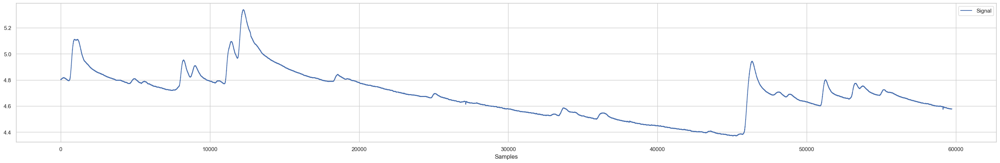

In [49]:
nk.signal_plot(eda_calm)

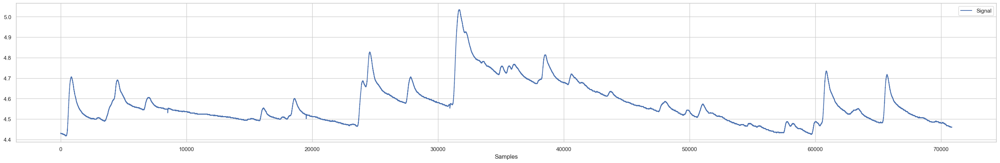

In [50]:
nk.signal_plot(eda_intense)

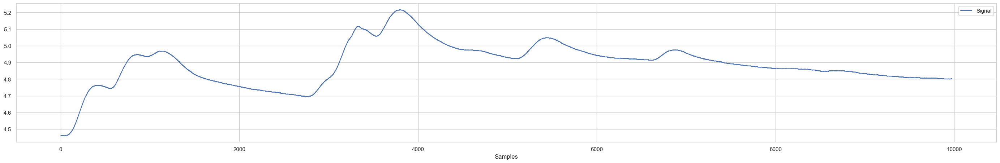

In [51]:
nk.signal_plot(eda_music)

In [52]:
plt.rcParams['figure.figsize'] = [35, 5]  # Bigger images

In [53]:
nk.eda_plot(signals_music, info_music, False)

In [54]:
nk.eda_plot(signals_calm, info_calm, False)

In [55]:
nk.eda_plot(signals_intense, info_calm, False)

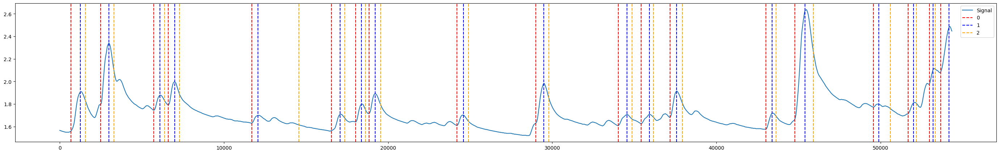

In [132]:
cleaned_calm = signals_calm["EDA_Clean"]
features_calm = [info_calm["SCR_Onsets"], info_calm["SCR_Peaks"], info_calm["SCR_Recovery"]]
plt.rcParams['figure.figsize'] = [35, 5]  # Bigger images
plot = nk.events_plot(features_calm, cleaned_calm, color=['red', 'blue', 'orange'])

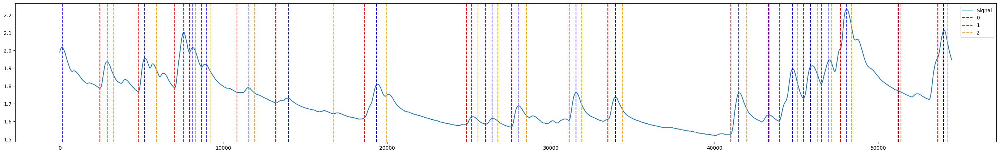

In [133]:
cleaned_intense= signals_intense["EDA_Clean"]
features_intense = [info_intense["SCR_Onsets"], info_intense["SCR_Peaks"], info_intense["SCR_Recovery"]]
plot = nk.events_plot(features_intense, cleaned_intense, color=['red', 'blue', 'orange'])

<Axes: >

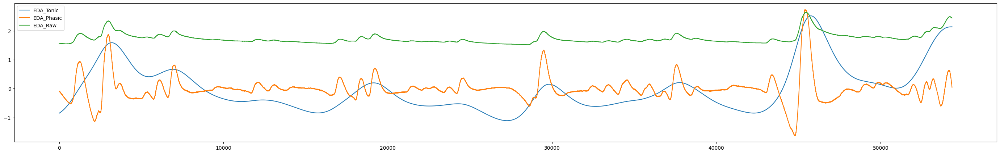

In [134]:
d_calm = nk.eda_phasic(nk.standardize(eda_calm), sampling_rate=Sample_rate)
d_calm["EDA_Raw"] = eda_calm  # Add raw signal
d_calm.plot()

<Axes: >

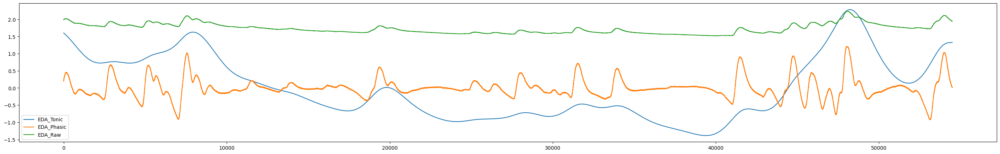

In [135]:
d_intense = nk.eda_phasic(nk.standardize(eda_intense), sampling_rate=Sample_rate)
d_intense["EDA_Raw"] = eda_intense  # Add raw signal
d_intense.plot()

In [56]:
nk.eda_intervalrelated(signals_music, sampling_rate=Sample_rate)

,SCR_Peaks_N,SCR_Peaks_Amplitude_Mean,EDA_Tonic_SD,EDA_Sympathetic,EDA_SympatheticN,EDA_Autocorrelation
0,6.0,0.178146,0.095563,NaN,NaN,0.121803


In [57]:
nk.eda_intervalrelated(signals_calm, sampling_rate=Sample_rate)

# SCR_Peaks_N: The number of occurrences of Skin Conductance Response (SCR).

# SCR_Peaks_Amplitude_Mean: The mean amplitude of the SCR peak occurrences.

# EDA_Tonic_SD: The mean amplitude of the SCR peak occurrences.

# "EDA_Sympathetic": see eda_sympathetic() (only computed if signal duration > 64 sec).

# "EDA_Autocorrelation": see eda_autocor() (only computed if signal duration > 30 sec).

,SCR_Peaks_N,SCR_Peaks_Amplitude_Mean,EDA_Tonic_SD,EDA_Sympathetic,EDA_SympatheticN,EDA_Autocorrelation
0,13.0,0.157852,0.16437,0.002377,0.000687,0.86406


In [58]:
nk.eda_intervalrelated(signals_intense, sampling_rate=Sample_rate)

,SCR_Peaks_N,SCR_Peaks_Amplitude_Mean,EDA_Tonic_SD,EDA_Sympathetic,EDA_SympatheticN,EDA_Autocorrelation
0,22.0,0.099627,0.089566,0.001784,0.000702,0.724883


# ECG

In [31]:
ecg_music = np.array(interim_data['Channel 13 (Raw)'].dropna())
ecg_calm = np.array(calm_data['Channel 13 (Raw)'].dropna())
ecg_intense = np.array(intense_data['Channel 13 (Raw)'].dropna())

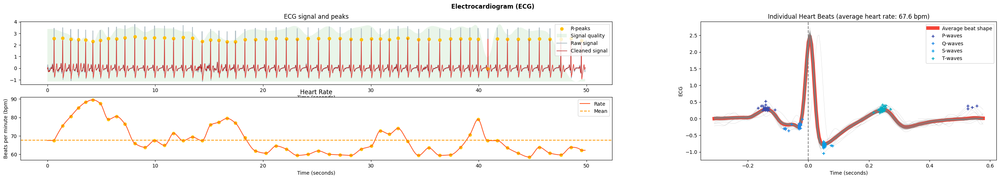

In [32]:
ecg_signals_music, ecg_info_music = nk.ecg_process(ecg_music, sampling_rate=Sample_rate)

nk.ecg_plot(ecg_signals_music, ecg_info_music)

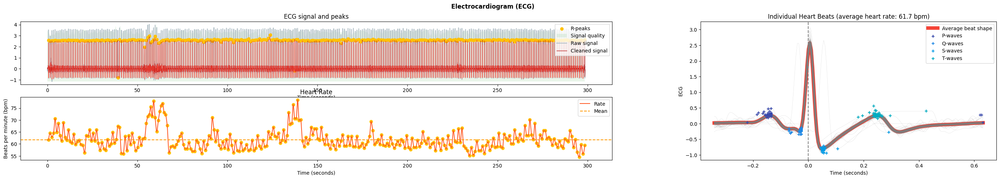

In [33]:
ecg_signals_calm, ecg_info_calm = nk.ecg_process(ecg_calm, sampling_rate=Sample_rate)

nk.ecg_plot(ecg_signals_calm, ecg_info_calm)

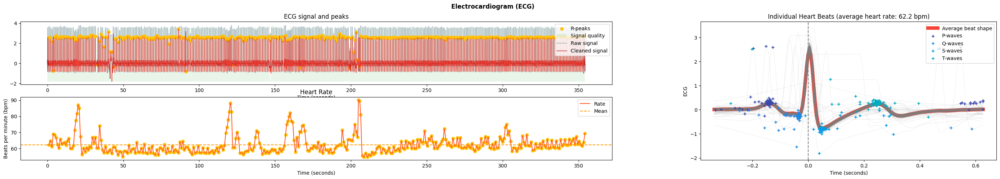

In [34]:
ecg_signals_intense, ecg_info_intense = nk.ecg_process(ecg_intense, sampling_rate=Sample_rate)

nk.ecg_plot(ecg_signals_intense, ecg_info_intense)

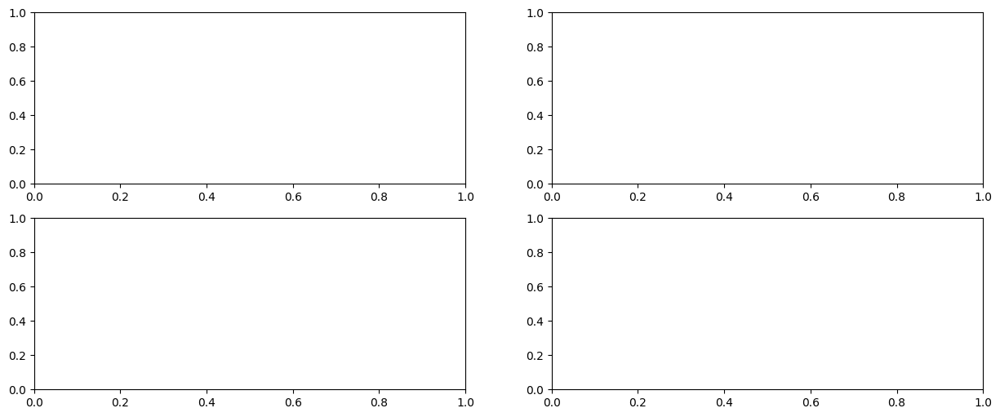

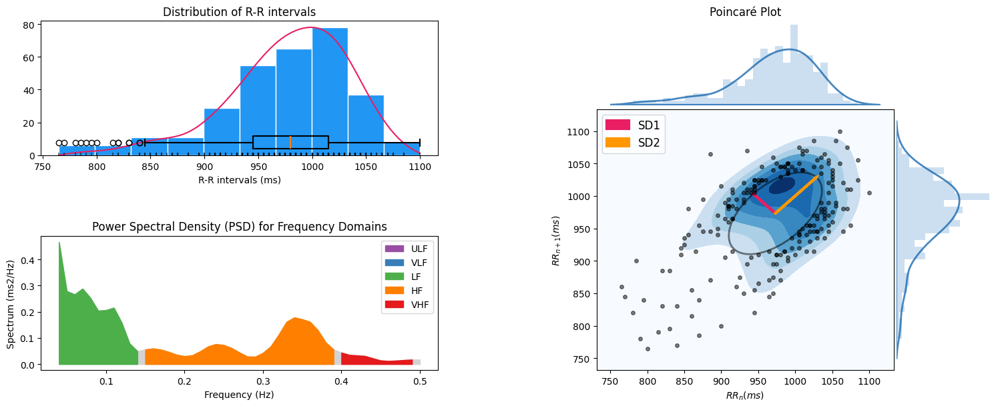

In [46]:
import matplotlib.pyplot as plt

# Your existing code for setting figure size
plt.rcParams['figure.figsize'] = [15, 6]

# Create your subplots (adjust rows, cols as per your layout)
fig, axes = plt.subplots(nrows=2, ncols=2)  # Example: 2 rows, 2 columns

peaks_calm, info_calm = nk.ecg_peaks(ecg_calm, sampling_rate=Sample_rate)
nk.hrv(peaks_calm, sampling_rate=Sample_rate, show=True)

# Adjust the spacing between subplots
plt.subplots_adjust(wspace=0.4, hspace=0.6)  # Increase these values as needed

# Display the plot
plt.show()

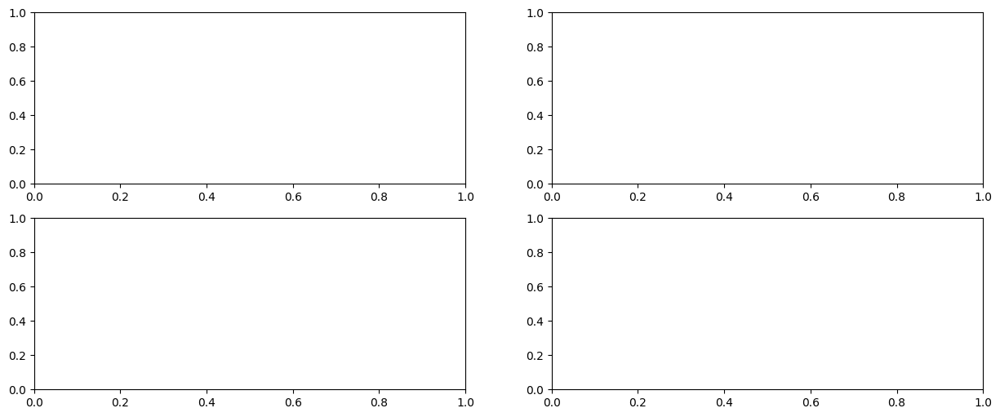

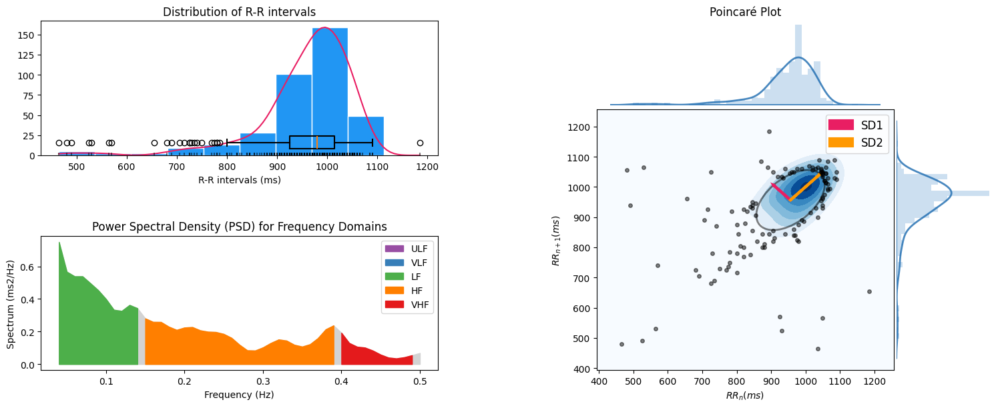

In [48]:

# Your existing code for setting figure size
plt.rcParams['figure.figsize'] = [15, 6]

# Create your subplots (adjust rows, cols as per your layout)
fig, axes = plt.subplots(nrows=2, ncols=2)  # Example: 2 rows, 2 columns

peaks_intense, info_intense = nk.ecg_peaks(ecg_intense, sampling_rate=Sample_rate)
nk.hrv(peaks_intense, sampling_rate=Sample_rate, show=True)

# Adjust the spacing between subplots
plt.subplots_adjust(wspace=0.4, hspace=0.6)  # Increase these values as needed

# Display the plot
plt.show()

# Distributions

In [6]:
Sample_rate = 200

In [3]:
import os


def get_data(data):

    calm_start = data[(data.MarkerName == "CalmAudio") & (data.MarkerType == "S")].Row.iloc[0]
    calm_end = data[(data.MarkerName == "CalmAudio") & (data.MarkerType == "E")] .Row.iloc[0]
    calm_data = data[int(calm_start):int(calm_end)]

    intense_start = data[(data.MarkerName == "IntenseAudio") & (data.MarkerType == "S")].Row.iloc[0]
    intense_end = data[(data.MarkerName == "IntenseAudio") & (data.MarkerType == "E")] .Row.iloc[0]
    intense_data = data[int(intense_start):int(intense_end)]

    return calm_data, intense_data

ecg_s_calm = []
ecg_s_intense = []
eda_s_calm = []
eda_s_intense = []

folder_path = "/Users/annapalatkina/Desktop/drive/participants_data"  

for filename in os.listdir(folder_path):
    file_path = os.path.join(folder_path, filename)  
    if os.path.isfile(file_path): 
        try:
            data = pd.read_csv(file_path, comment='#')
            if 'Channel 9 (EDA100C)' in data.columns:
                eda_column = 'Channel 9 (EDA100C)'
                ecg_column = 'Channel 13 (ECG100C)'
            elif 'Channel 9 (Raw)' in data.columns:
                eda_column = 'Channel 9 (Raw)'
                ecg_column = 'Channel 13 (Raw)'
            data = data[['Row', 'Timestamp', eda_column, ecg_column,'MarkerName','MarkerType']]
        except Exception as e:
            continue 
        calm_data, intense_data = get_data(data)
        eda_s_calm.append(np.array(calm_data[eda_column].dropna()))
        eda_s_intense.append(np.array(intense_data[eda_column].dropna()))
        ecg_s_calm.append(np.array(calm_data[ecg_column].dropna()))
        ecg_s_intense.append(np.array(intense_data[ecg_column].dropna()))

/var/folders/f1/w7d0x47j0qq9jn7k7vhjrkzh0000gn/T/ipykernel_39219/3091989595.py:27: DtypeWarning: Columns (3,4,6,15,16,17) have mixed types. Specify dtype option on import or set low_memory=False.
  data = pd.read_csv(file_path, comment='#')
/var/folders/f1/w7d0x47j0qq9jn7k7vhjrkzh0000gn/T/ipykernel_39219/3091989595.py:27: DtypeWarning: Columns (3,4,6,15,16,17) have mixed types. Specify dtype option on import or set low_memory=False.
  data = pd.read_csv(file_path, comment='#')
/var/folders/f1/w7d0x47j0qq9jn7k7vhjrkzh0000gn/T/ipykernel_39219/3091989595.py:27: DtypeWarning: Columns (3,4,6,15,16,17) have mixed types. Specify dtype option on import or set low_memory=False.
  data = pd.read_csv(file_path, comment='#')
/var/folders/f1/w7d0x47j0qq9jn7k7vhjrkzh0000gn/T/ipykernel_39219/3091989595.py:27: DtypeWarning: Columns (3,4,6,15,16,17) have mixed types. Specify dtype option on import or set low_memory=False.
  data = pd.read_csv(file_path, comment='#')
/var/folders/f1/w7d0x47j0qq9jn7k7vhj

In [7]:
len(eda_s_calm)

8

## EDA

In [ ]:
def extract_eda_info(eda_s):
    n_peaks = []
    ampl_peaks = []
    for eda in eda_s:
        signal, _= nk.eda_process(eda, sampling_rate=Sample_rate)
        d = nk.eda_intervalrelated(signal, sampling_rate=Sample_rate)
        n_peaks.append(d['SCR_Peaks_N'][0])
        ampl_peaks.append(d['SCR_Peaks_Amplitude_Mean'][0])

    return n_peaks,  ampl_peaks 

n_peaks_calm, ampl_peaks_calm = extract_eda_info(eda_s_calm)
n_peaks_intense, ampl_peaks_intense = extract_eda_info(eda_s_intense)

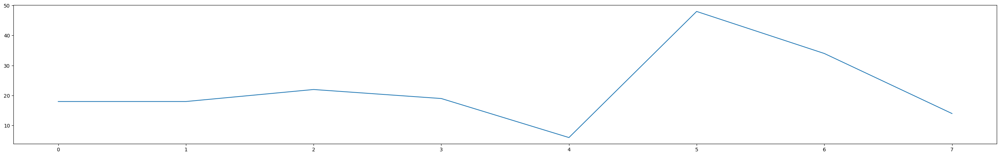

In [19]:
plt.plot(n_peaks_calm)

In [9]:
n_peaks_calm,'---', n_peaks_intense

([np.float64(18.0),
  np.float64(18.0),
  np.float64(22.0),
  np.float64(19.0),
  np.float64(6.0),
  np.float64(48.0),
  np.float64(34.0),
  np.float64(14.0)],
 '---',
 [np.float64(23.0),
  np.float64(18.0),
  np.float64(28.0),
  np.float64(22.0),
  np.float64(6.0),
  np.float64(29.0),
  np.float64(19.0),
  np.float64(97.0)])

In [10]:
ampl_peaks_calm, '---', ampl_peaks_intense

([np.float64(0.03744157483002536),
  np.float64(0.14892009956113872),
  np.float64(0.19764728226901784),
  np.float64(0.18618475232905465),
  np.float64(0.009551761070297496),
  np.float64(0.2742195667336836),
  np.float64(0.004081254240951719),
  np.float64(0.003833837255978576)],
 '---',
 [np.float64(0.045405656836982576),
  np.float64(0.2029361322015187),
  np.float64(0.07852015020003943),
  np.float64(0.10937256036838351),
  np.float64(0.025586472939177592),
  np.float64(0.23294728875036047),
  np.float64(0.02869053157456811),
  np.float64(0.0008740090888272394)])

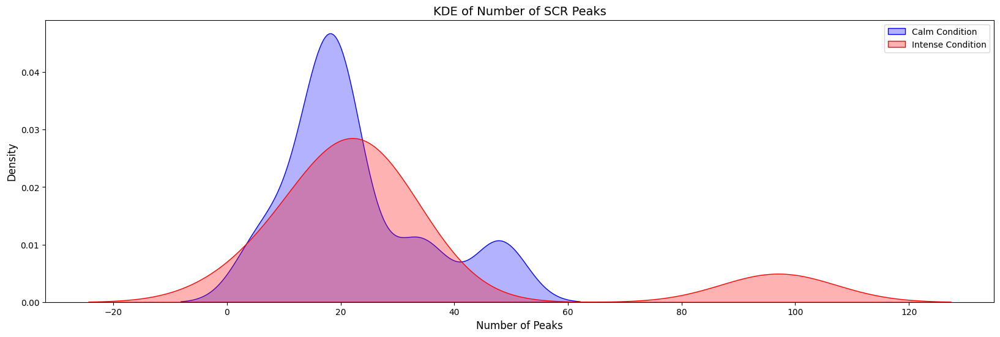

In [12]:
plt.figure(figsize=(20, 6))
sns.kdeplot(n_peaks_calm, label='Calm Condition', color='blue', fill=True, alpha=0.3, bw_adjust=.55)
sns.kdeplot(n_peaks_intense, label='Intense Condition', color='red', fill=True, alpha=0.3, bw_adjust=.55)
plt.title('KDE of Number of SCR Peaks', fontsize=14)
plt.xlabel('Number of Peaks', fontsize=12)
plt.ylabel('Density', fontsize=12)
#plt.xlim(0, 15)  # Set x-axis limit based on data range
plt.legend()
plt.show()

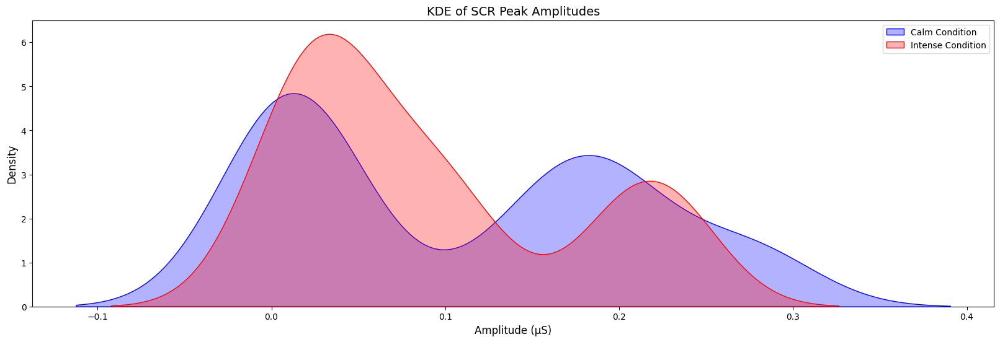

In [13]:
plt.figure(figsize=(20, 6))
sns.kdeplot(ampl_peaks_calm, label='Calm Condition', color='blue', fill=True, alpha=0.3,  bw_adjust=.55)
sns.kdeplot(ampl_peaks_intense, label='Intense Condition', color='red', fill=True, alpha=0.3, bw_adjust=.55)
plt.title('KDE of SCR Peak Amplitudes', fontsize=14)
plt.xlabel('Amplitude (μS)', fontsize=12)
plt.ylabel('Density', fontsize=12)
#plt.xlim(0, 2)  # Set x-axis limit based on data range
plt.legend()
plt.show()

# ECG

In [14]:
def extract_signals(ecg_data):
    HRV_MeanNN = []
    HRV_SDNN = []
    HRV_RMSSD = []
    for ecg in ecg_data:
        peaks, _ = nk.ecg_peaks(ecg, sampling_rate=200)
        hrv_time = nk.hrv_time(peaks, sampling_rate=200, show=False) 
        HRV_MeanNN.append(hrv_time.HRV_MeanNN[0])
        HRV_SDNN.append(hrv_time.HRV_SDNN[0])
        HRV_RMSSD.append(hrv_time.HRV_RMSSD[0])

    return HRV_MeanNN, HRV_SDNN, HRV_RMSSD

HRV_MeanNN_calm, HRV_SDNN_calm, HRV_RMSSD_calm = extract_signals(ecg_s_calm)
HRV_MeanNN_intense, HRV_SDNN_intense, HRV_RMSSD_intense = extract_signals(ecg_s_intense)

In [15]:
HRV_MeanNN_intense

[np.float64(799.9705014749262),
 np.float64(779.3804034582132),
 np.float64(738.5967302452316),
 np.float64(776.3),
 np.float64(768.2909604519774),
 np.float64(800.2654867256637),
 np.float64(553.3706720977597),
 np.float64(925.1535836177475)]

In [16]:
HRV_MeanNN_calm

[np.float64(792.2222222222222),
 np.float64(775.7902298850574),
 np.float64(728.9516129032259),
 np.float64(776.0315186246419),
 np.float64(753.7465181058495),
 np.float64(772.5071225071225),
 np.float64(577.5799573560768),
 np.float64(885.4411764705883)]

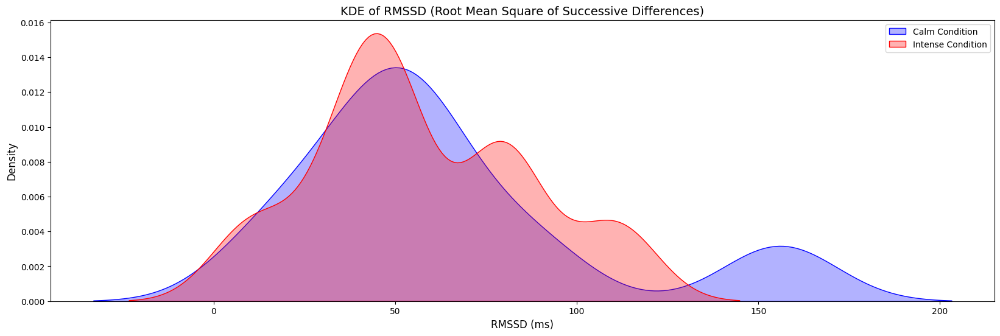

In [17]:
plt.figure(figsize=(20, 6))
sns.kdeplot(HRV_RMSSD_calm, label='Calm Condition', color='blue', fill=True, alpha=0.3, bw_adjust=.55)
sns.kdeplot(HRV_RMSSD_intense, label='Intense Condition', color='red', fill=True, alpha=0.3, bw_adjust=.55)
plt.title('KDE of RMSSD (Root Mean Square of Successive Differences)', fontsize=14)
plt.xlabel('RMSSD (ms)', fontsize=12)
plt.ylabel('Density', fontsize=12)
# Uncomment and adjust the x-axis limit if needed based on your data range
# plt.xlim(0, 150)  
plt.legend()
plt.show()

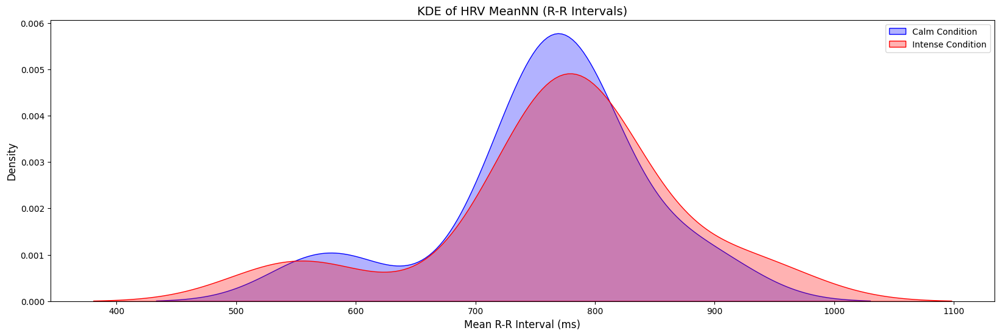

In [18]:
plt.figure(figsize=(20, 6))
sns.kdeplot(HRV_MeanNN_calm, label='Calm Condition', color='blue', fill=True, alpha=0.3, bw_adjust=.85)
sns.kdeplot(HRV_MeanNN_intense, label='Intense Condition', color='red', fill=True, alpha=0.3, bw_adjust=.85)
plt.title('KDE of HRV MeanNN (R-R Intervals)', fontsize=14)
plt.xlabel('Mean R-R Interval (ms)', fontsize=12)
plt.ylabel('Density', fontsize=12)
# Uncomment and adjust the x-axis limit if needed based on your data range
# plt.xlim(500, 1200)  
plt.legend()
plt.show()

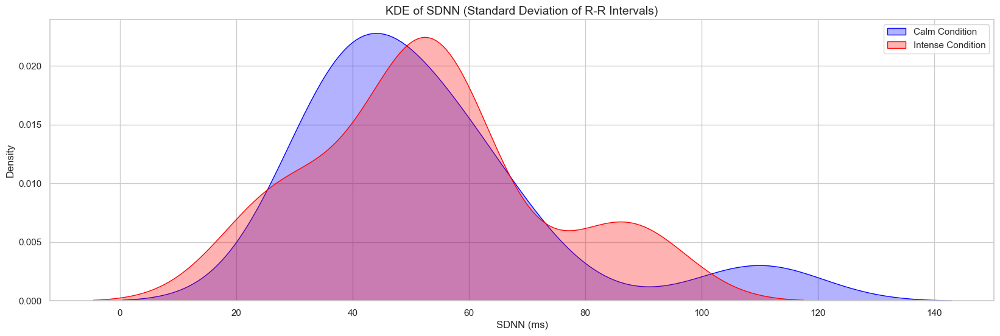

In [77]:
plt.figure(figsize=(20, 6))
sns.kdeplot(HRV_SDNN_calm, label='Calm Condition', color='blue', fill=True, alpha=0.3, bw_adjust=.85)
sns.kdeplot(HRV_SDNN_intense, label='Intense Condition', color='red', fill=True, alpha=0.3, bw_adjust=.85)
plt.title('KDE of SDNN (Standard Deviation of R-R Intervals)', fontsize=14)
plt.xlabel('SDNN (ms)', fontsize=12)
plt.ylabel('Density', fontsize=12)
# Uncomment and adjust the x-axis limit if needed based on your data range
# plt.xlim(0, 200)  
plt.legend()
plt.show()